In [74]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer


In [34]:
df = pd.read_csv('G:\Resources_term1_LV3\Data mining -20250923T162454Z-1-001\Data mining\Section\Models\dataset.csv')
df.head()

<>:1: SyntaxWarning: invalid escape sequence '\R'
<>:1: SyntaxWarning: invalid escape sequence '\R'
C:\Users\top\AppData\Local\Temp\ipykernel_11216\2829412597.py:1: SyntaxWarning: invalid escape sequence '\R'
  df = pd.read_csv('G:\Resources_term1_LV3\Data mining -20250923T162454Z-1-001\Data mining\Section\Models\dataset.csv')


,age,gender,job_type,daily_social_media_time,social_platform_preference,number_of_notifications,work_hours_per_day,perceived_productivity_score,actual_productivity_score,stress_level,sleep_hours,screen_time_before_sleep,breaks_during_work,uses_focus_apps,has_digital_wellbeing_enabled,coffee_consumption_per_day,days_feeling_burnout_per_month,weekly_offline_hours,job_satisfaction_score
0,56,Male,Unemployed,4.180940,Facebook,61,6.753558,8.040464,7.291555,4.0,5.116546,0.419102,8,False,False,4,11,21.927072,6.336688
1,46,Male,Health,3.249603,Twitter,59,9.169296,5.063368,5.165093,7.0,5.103897,0.671519,7,True,True,2,25,0.000000,3.412427
2,32,Male,Finance,NaN,Twitter,57,7.910952,3.861762,3.474053,4.0,8.583222,0.624378,0,True,False,3,17,10.322044,2.474944
3,60,Female,Unemployed,NaN,Facebook,59,6.355027,2.916331,1.774869,6.0,6.052984,1.204540,1,False,False,0,4,23.876616,1.733670
4,25,Male,IT,NaN,Telegram,66,6.214096,8.868753,NaN,7.0,5.405706,1.876254,1,False,True,1,30,10.653519,9.693060


In [21]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 19 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   age                             30000 non-null  int64  
 1   gender                          30000 non-null  object 
 2   job_type                        30000 non-null  object 
 3   daily_social_media_time         27235 non-null  float64
 4   social_platform_preference      30000 non-null  object 
 5   number_of_notifications         30000 non-null  int64  
 6   work_hours_per_day              30000 non-null  float64
 7   perceived_productivity_score    28386 non-null  float64
 8   actual_productivity_score       27635 non-null  float64
 9   stress_level                    28096 non-null  float64
 10  sleep_hours                     27402 non-null  float64
 11  screen_time_before_sleep        27789 non-null  float64
 12  breaks_during_work              

In [22]:
df.describe()

,age,daily_social_media_time,number_of_notifications,work_hours_per_day,perceived_productivity_score,actual_productivity_score,stress_level,sleep_hours,screen_time_before_sleep,breaks_during_work,coffee_consumption_per_day,days_feeling_burnout_per_month,weekly_offline_hours,job_satisfaction_score
count,30000.000000,27235.000000,30000.000000,30000.000000,28386.000000,27635.000000,28096.000000,27402.000000,27789.000000,30000.000000,30000.000000,30000.000000,30000.000000,27270.000000
mean,41.486867,3.113418,59.958767,6.990792,5.510488,4.951805,5.514059,6.500247,1.025568,4.992200,1.999300,15.557067,10.360655,4.964901
std,13.835221,2.074813,7.723772,1.997736,2.023470,1.883378,2.866344,1.464004,0.653355,3.173737,1.410047,9.252956,7.280415,2.121194
min,18.000000,0.000000,30.000000,0.000000,2.000252,0.296812,1.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,1.639566,55.000000,5.643771,3.757861,3.373284,3.000000,5.493536,0.528490,2.000000,1.000000,8.000000,4.541872,3.363580
50%,41.000000,3.025913,60.000000,6.990641,5.525005,4.951742,6.000000,6.498340,1.006159,5.000000,2.000000,16.000000,10.013677,4.951049
75%,53.000000,4.368917,65.000000,8.354725,7.265776,6.526342,8.000000,7.504143,1.477221,8.000000,3.000000,24.000000,15.300809,6.581323
max,65.000000,17.973256,90.000000,12.000000,8.999376,9.846258,10.000000,10.000000,3.000000,10.000000,10.000000,31.000000,40.964769,10.000000


In [77]:
df.isnull().sum()

age                               0
gender                            0
job_type                          0
daily_social_media_time           0
social_platform_preference        0
number_of_notifications           0
work_hours_per_day                0
perceived_productivity_score      0
actual_productivity_score         0
stress_level                      0
sleep_hours                       0
screen_time_before_sleep          0
breaks_during_work                0
uses_focus_apps                   0
has_digital_wellbeing_enabled     0
coffee_consumption_per_day        0
days_feeling_burnout_per_month    0
weekly_offline_hours              0
job_satisfaction_score            0
log_dsmt                          0
log_screen_time_before_sleep      0
group_age                         0
dtype: int64

In [36]:
df['screen_time_before_sleep'].value_counts(dropna=False)

screen_time_before_sleep
NaN         2211
0.000000    2164
3.000000      60
2.316167       1
1.302390       1
            ... 
0.889256       1
0.599293       1
1.341070       1
1.263446       1
1.087081       1
Name: count, Length: 25568, dtype: int64

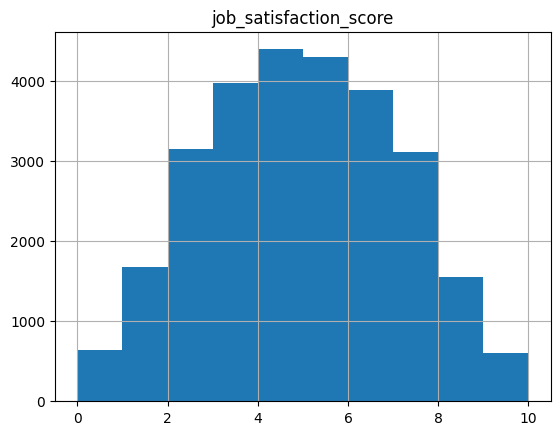

In [25]:
df.hist('job_satisfaction_score')
plt.show()

In [38]:
median = df['weekly_offline_hours'].median()  # handling missing data with median because this attribute has many outliers 
df['weekly_offline_hours'].fillna(median, inplace=True)

C:\Users\top\AppData\Local\Temp\ipykernel_11216\4038381494.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['weekly_offline_hours'].fillna(median, inplace=True)


In [45]:
# daily_social_media_time           2765
# social_platform_preference           0
# number_of_notifications              0
# work_hours_per_day                   0
# perceived_productivity_score      1614
# actual_productivity_score         2365
# stress_level                      1904
# sleep_hours                       2598
# screen_time_before_sleep          2211
# breaks_during_work                   0
# uses_focus_apps                      0
# has_digital_wellbeing_enabled        0
# coffee_consumption_per_day           0
# days_feeling_burnout_per_month       0
# weekly_offline_hours                 0
# job_satisfaction_score            2730

mean = df['daily_social_media_time'].mean()
df['daily_social_media_time'].fillna(mean, inplace=True)

C:\Users\top\AppData\Local\Temp\ipykernel_11216\1031090695.py:19: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['daily_social_media_time'].fillna(mean, inplace=True)


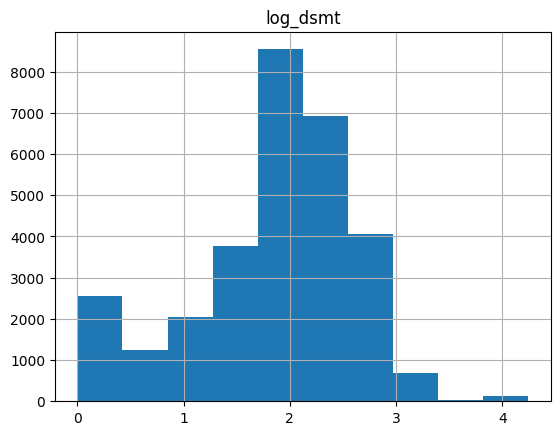

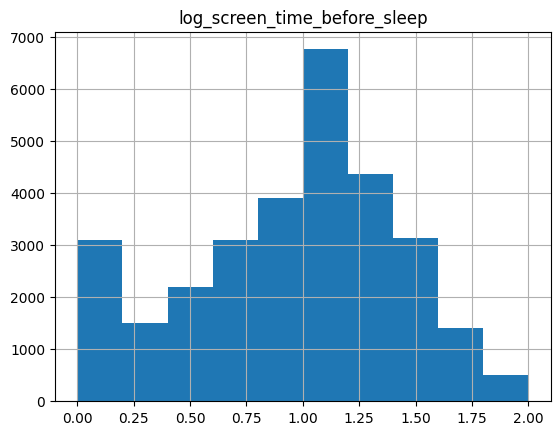

In [47]:
df['log_dsmt'] = np.log2(df['daily_social_media_time']+1)
df['log_screen_time_before_sleep'] = np.log2(df['screen_time_before_sleep']+1)

df.hist('log_dsmt')
df.hist('log_screen_time_before_sleep')
plt.show()

In [29]:
correlations = df.corr(numeric_only=True)
correlations

,age,daily_social_media_time,number_of_notifications,work_hours_per_day,perceived_productivity_score,actual_productivity_score,stress_level,sleep_hours,screen_time_before_sleep,breaks_during_work,uses_focus_apps,has_digital_wellbeing_enabled,coffee_consumption_per_day,days_feeling_burnout_per_month,weekly_offline_hours,job_satisfaction_score,log_dsmt,log_screen_time_before_sleep
age,1.000000,-0.002346,-0.003799,-0.003231,0.008832,0.010575,0.005436,0.002785,0.005222,-0.010918,0.001524,-0.005594,-0.001162,-0.002998,0.003086,0.014080,-0.001525,0.005238
daily_social_media_time,-0.002346,1.000000,-0.000872,-0.002903,-0.010696,-0.010412,0.000734,0.011284,-0.004129,0.014112,-0.004710,-0.003593,-0.003904,0.002200,-0.001482,-0.004149,0.926168,-0.004694
number_of_notifications,-0.003799,-0.000872,1.000000,0.013068,-0.003873,0.000457,-0.003084,0.004076,0.013799,0.008816,0.004320,-0.001722,0.006088,0.005248,-0.000938,-0.004716,0.000761,0.016344
work_hours_per_day,-0.003231,-0.002903,0.013068,1.000000,0.003925,-0.000113,0.002348,0.000939,-0.007405,-0.008151,-0.000395,0.002251,-0.003071,0.003391,-0.002061,-0.002155,-0.000048,-0.007257
perceived_productivity_score,0.008832,-0.010696,-0.003873,0.003925,1.000000,0.964319,0.002007,-0.013537,0.001789,-0.003096,-0.003870,-0.006939,0.000008,-0.011507,-0.004880,0.851342,-0.010202,0.000403
actual_productivity_score,0.010575,-0.010412,0.000457,-0.000113,0.964319,1.000000,0.001339,-0.007868,0.002399,-0.004203,-0.001023,-0.006856,0.001156,-0.011001,-0.004839,0.882965,-0.008620,0.000691
stress_level,0.005436,0.000734,-0.003084,0.002348,0.002007,0.001339,1.000000,0.004119,-0.001497,0.001139,0.002053,-0.011680,-0.000729,-0.000561,-0.004430,-0.000569,0.003149,-0.002528
sleep_hours,0.002785,0.011284,0.004076,0.000939,-0.013537,-0.007868,0.004119,1.000000,-0.001583,0.005617,0.001364,0.000163,0.009729,-0.005257,-0.006997,-0.005101,0.009612,-0.002706
screen_time_before_sleep,0.005222,-0.004129,0.013799,-0.007405,0.001789,0.002399,-0.001497,-0.001583,1.000000,-0.004316,-0.010361,0.001714,-0.003992,0.001433,-0.003042,0.005407,-0.002305,0.982233
breaks_during_work,-0.010918,0.014112,0.008816,-0.008151,-0.003096,-0.004203,0.001139,0.005617,-0.004316,1.000000,-0.004046,0.001016,0.004647,-0.003668,0.006579,-0.003262,0.007981,-0.004390


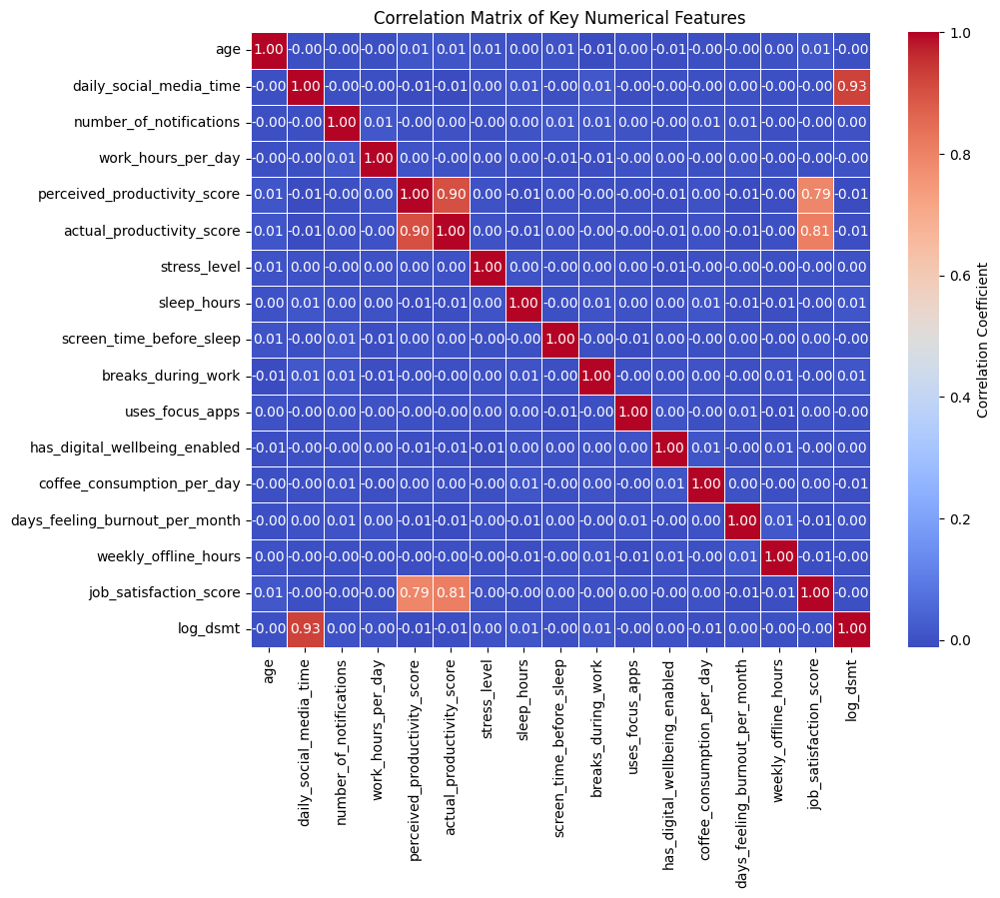

In [48]:
numerical_cols = [
    'age', 
    'daily_social_media_time', 
    'number_of_notifications', 
    'work_hours_per_day', 
    'perceived_productivity_score', 
    'actual_productivity_score', 
    'stress_level', 
    'sleep_hours',
    'screen_time_before_sleep',
    'breaks_during_work',
    'uses_focus_apps',
    'has_digital_wellbeing_enabled',
    'coffee_consumption_per_day',
    'days_feeling_burnout_per_month',
    'weekly_offline_hours',	
    'job_satisfaction_score',	
    'log_dsmt'
]

corr_matrix = df[numerical_cols].corr()

# 2. Visualize the correlation matrix as a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(
    corr_matrix, 
    annot=True,            
    fmt=".2f",             
    cmap='coolwarm',       
    linewidths=.5,         
    cbar_kws={'label': 'Correlation Coefficient'}
)
plt.title('Correlation Matrix of Key Numerical Features')
plt.show()

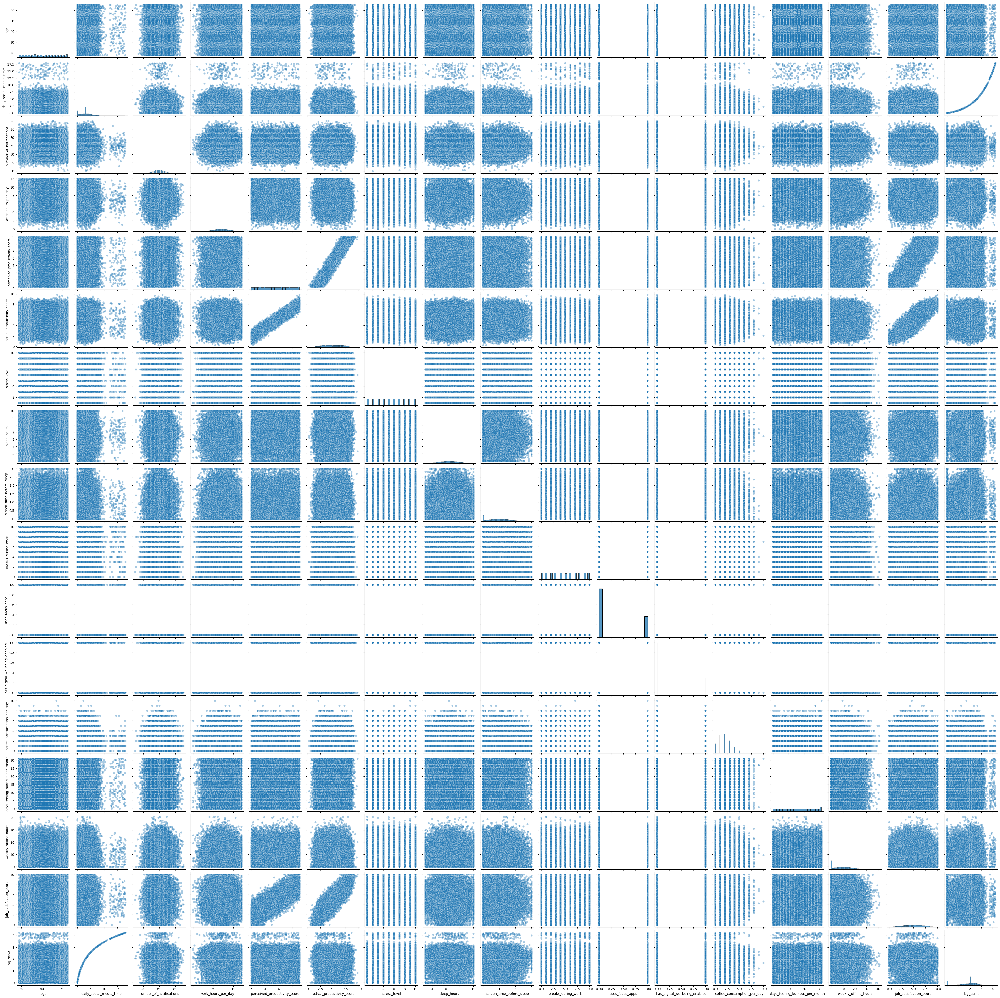

In [31]:
sns.pairplot(df[numerical_cols], kind='scatter', plot_kws={'alpha' : 0.4})

In [ ]:


numeric_col = [
    'age',
    'daily_social_media_time',
    'number_of_notifications',
    'work_hours_per_day',
    'perceived_productivity_score',
    'stress_level',
    'screen_time_before_sleep',
    'breaks_during_work',
    'coffee_consumption_per_day',
    'days_feeling_burnout_per_month',
    'weekly_offline_hours',
    'job_satisfaction_score',
    'log_dsmt',
    'log_screen_time_before_sleep'
]

scaler = StandardScaler()
# df_scale = df.copy()
df_scale[numeric_col] = scaler.fit_transform(df[numeric_col])

print(df_scale.head())

        age  gender    job_type  daily_social_media_time  \
0  1.049017    Male  Unemployed             5.400111e-01   
1  0.326212    Male      Health             6.888979e-02   
2 -0.685715    Male     Finance             4.492895e-16   
3  1.338138  Female  Unemployed             4.492895e-16   
4 -1.191679    Male          IT             4.492895e-16   

  social_platform_preference  number_of_notifications  work_hours_per_day  \
0                   Facebook                 0.134811           -0.118753   
1                    Twitter                -0.124134            1.090505   
2                    Twitter                -0.383079            0.460609   
3                   Facebook                -0.124134           -0.318248   
4                   Telegram                 0.782174           -0.388795   

   perceived_productivity_score  actual_productivity_score  stress_level  ...  \
0                      1.285392                   7.291555     -0.545834  ...   
1             

In [86]:

bins = [18, 30, 40, 55, 66]

labels = [
    'Young Adult', 
    'Early Career', 
    'Mid Career', 
    'Senior Career'
]

df['group_age'] = pd.cut(
    df['age'],
    bins = bins,
    labels = labels,
    right = False,
    include_lowest=True
)

print(df[['age', 'group_age']].head(10).to_string(index=False))


# y = df['actual_productivity_score']
# X = df.drop(columns=['actual_productivity_score'])

# columns_to_drop = [
#     'age',
#     'daily_social_media_time', 
#     'screen_time_before_sleep' 
# ]
# X = X.drop(columns=columns_to_drop)

 age     group_age
  56 Senior Career
  46    Mid Career
  32  Early Career
  60 Senior Career
  25   Young Adult
  38  Early Career
  56 Senior Career
  36  Early Career
  40    Mid Career
  28   Young Adult


In [87]:
categorical_cols = ['gender', 'job_type', 'social_platform_preference', 'group_age']

# --- OneHotEncoder inside ColumnTransformer ---
ct = ColumnTransformer(
    transformers=[
        ('cat', OneHotEncoder(sparse_output=False, handle_unknown='ignore', drop='first'), categorical_cols)
    ],
    remainder='passthrough'   # keep all other non-categorical columns
)

# Apply encoding
df_encoded = ct.fit_transform(df)

# Get names of OHE output columns
ohe_feature_names = ct.named_transformers_['cat'].get_feature_names_out(categorical_cols)

all_feature_names = list(ohe_feature_names) + [
    col for col in df.columns if col not in categorical_cols
]

# Convert to DataFrame
df_encoded = pd.DataFrame(df_encoded, columns=all_feature_names)

print(df_encoded.head().to_string())

  gender_Male gender_Other job_type_Finance job_type_Health job_type_IT job_type_Student job_type_Unemployed social_platform_preference_Instagram social_platform_preference_Telegram social_platform_preference_TikTok social_platform_preference_Twitter group_age_Mid Career group_age_Senior Career group_age_Young Adult age daily_social_media_time number_of_notifications work_hours_per_day perceived_productivity_score actual_productivity_score stress_level sleep_hours screen_time_before_sleep breaks_during_work uses_focus_apps has_digital_wellbeing_enabled coffee_consumption_per_day days_feeling_burnout_per_month weekly_offline_hours job_satisfaction_score  log_dsmt log_screen_time_before_sleep
0         1.0          0.0              0.0             0.0         0.0              0.0                 1.0                                  0.0                                 0.0                               0.0                                0.0                  0.0                     1.0     

In [104]:
selected_features = [
    'log_dsmt',        # log(daily_social_media_time)         
    'log_screen_time_before_sleep',     
    'stress_level',
    'perceived_productivity_score',
    'work_hours_per_day',
    'number_of_notifications',
    'group_age_Mid Career',
    'group_age_Senior Career',
    'group_age_Young Adult'
]

x = df_encoded[selected_features]

target = df_encoded['actual_productivity_score']

x_train, x_test, y_train, y_test = train_test_split(x, target, test_size = 0.2, random_state = 42)

model = LinearRegression()
model.fit(x_train, y_train)

y_pred = model.predict(x_test)

mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

print("MSE:", mse)
print("RMSE:", rmse)
print("R² Score:", r2)

# df_encoded.info()

MSE: 0.6190246931285245
RMSE: 0.7867812231672312
R² Score: 0.8089592664924634
